In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

In [20]:
import seaborn as sns
#import pandas_profiling

In [21]:
# for WORD CLOUD
from collections import Counter
from nltk.tokenize import RegexpTokenizer
from stop_words import get_stop_words
import nltk
from nltk.corpus import stopwords
from nltk import sent_tokenize, word_tokenize

import re

In [22]:
#installing 
from wordcloud import WordCloud, STOPWORDS

In [23]:
#Perform Sentiment Analysis , installing 

from textblob import TextBlob

In [24]:
## inline = code and visualization right after it 
%pylab inline
## parameters for size 
pylab.rcParams['figure.figsize'] = (14.0, 12.0)

Populating the interactive namespace from numpy and matplotlib


In [25]:
yb = pd.read_csv('WomensReviews.csv')

yb.head(5)

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


#Cleaning Data

In [70]:
yb.drop(yb.columns[0],inplace=True, axis=1)
yb.head(2)

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Review Length
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,53
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses,303



# Delete missing observations for following variables
for x in ["Division Name","Department Name","Class Name","Review Text"]:   
          df = df[df[x].notnull()]

In [91]:
# Extracting Missing Count and Unique Count by Column
#creating a dictonary
unique_count = []
for x in yb.columns:   
    unique_count.append([x,len(yb[x].unique()),yb[x].isnull().sum()])
    
count_yb = pd.DataFrame(unique_count, columns=["Column","Unique","Missing"]).set_index("Column").T
count_yb

Column,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Review Length
Unique,1206,77,13994,22635,5,2,82,4,7,21,498
Missing,0,0,3810,0,0,0,0,14,14,14,0


In [92]:
# Missing Values
print("Missing Values:\n{}".format(yb.isnull().sum().sum()))

# Data Dimensions
print("Dataframe Dimension: {} Rows, {} Columns".format(*yb.shape))

Missing Values:
3852
Dataframe Dimension: 23486 Rows, 11 Columns


In [ ]:
# Create New Variables: 
# Word Length
df["Word Count"] = df['Review Text'].str.split().apply(len)
# Character Length
df["Character Count"] = df['Review Text'].apply(len)

# Boolean for Positive and Negative Reviews , can be done based on review
   df["Label"] = 0
   df.loc[df.Rating >= 3,[\"Label\"]] = 1"

In [73]:
# what does the data look like? Numerical data
yb.describe()

,Clothing ID,Age,Rating,Recommended IND,Positive Feedback Count,Review Length
count,23486.000000,23486.000000,23486.000000,23486.000000,23486.000000,23486.000000
mean,918.118709,43.198544,4.196032,0.822362,2.535936,297.689602
std,203.298980,12.279544,1.110031,0.382216,5.702202,152.363034
min,0.000000,18.000000,1.000000,0.000000,0.000000,3.000000
25%,861.000000,34.000000,4.000000,1.000000,0.000000,173.000000
50%,936.000000,41.000000,5.000000,1.000000,1.000000,292.000000
75%,1078.000000,52.000000,5.000000,1.000000,3.000000,451.000000
max,1205.000000,99.000000,5.000000,1.000000,122.000000,508.000000


In [27]:
yb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 11 columns):
Unnamed: 0                 23486 non-null int64
Clothing ID                23486 non-null int64
Age                        23486 non-null int64
Title                      19676 non-null object
Review Text                22641 non-null object
Rating                     23486 non-null int64
Recommended IND            23486 non-null int64
Positive Feedback Count    23486 non-null int64
Division Name              23472 non-null object
Department Name            23472 non-null object
Class Name                 23472 non-null object
dtypes: int64(6), object(5)
memory usage: 2.0+ MB


In [28]:
#Rows = 23486
#Col = 

In [29]:
# verify no duplicates 
yb[yb.duplicated()]

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name


#Analysis of Data to find a hypothesis

In [30]:
#Finding Relation between Rating and Length of Review
yb['Review Text']=yb['Review Text'].astype(str)
yb['Review Length']=yb['Review Text'].apply(len)

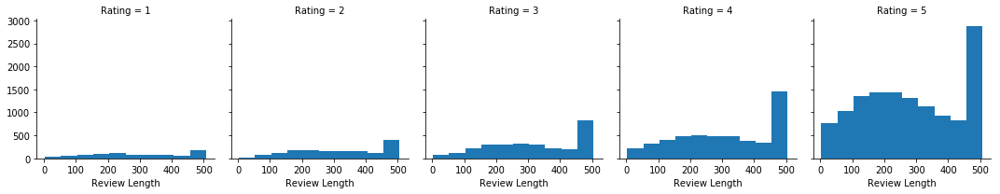

In [31]:
#Plot graph 
g = sns.FacetGrid(data=yb, col='Rating')
g.map(plt.hist, 'Review Length')

In [32]:
#This means user leave 5 rating often , less people leave 1 or 2 rating

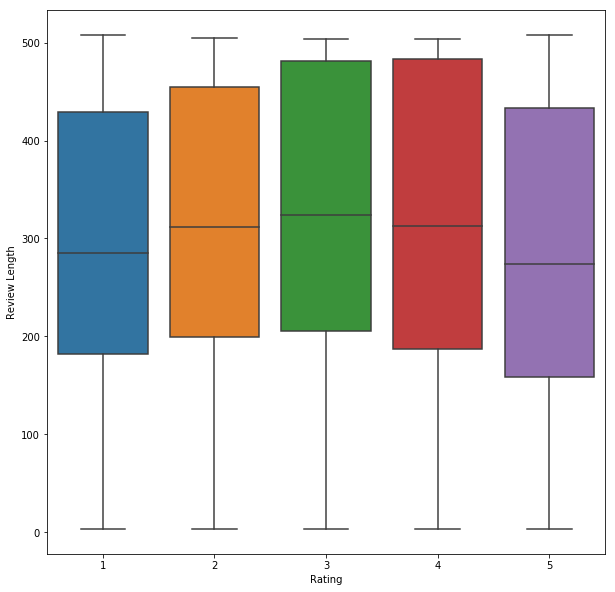

In [33]:
#Combining 
plt.figure(figsize=(10,10))
sns.boxplot(x='Rating', y='Review Length', data=yb)

In [34]:
#more review length of rating 3 and 4

In [74]:
yb.groupby('Rating').mean()

,Clothing ID,Age,Recommended IND,Positive Feedback Count,Review Length
Rating,,,,,
1,916.214964,43.693587,0.019002,3.459620,296.627078
2,925.016613,42.622364,0.060064,3.325879,315.383387
3,928.110414,42.158481,0.414141,3.145246,322.001742
4,921.410282,42.887532,0.966910,2.405554,311.784321
5,913.961389,43.583124,0.998096,2.299749,284.883634


In [83]:
#Create New data set with grouping based on rating
rating = yb.groupby('Rating')
rating.corr()

Age  Clothing ID  \
Rating                                                  
1      Age                      1.000000    -0.018472   
       Clothing ID             -0.018472     1.000000   
       Positive Feedback Count  0.029847     0.042721   
       Recommended IND          0.096777     0.002876   
       Review Length           -0.100625     0.095392   
2      Age                      1.000000     0.030458   
       Clothing ID              0.030458     1.000000   
       Positive Feedback Count  0.015076     0.045313   
       Recommended IND          0.026269    -0.015991   
       Review Length            0.009703     0.088765   
3      Age                      1.000000    -0.019181   
       Clothing ID             -0.019181     1.000000   
       Positive Feedback Count  0.045924     0.039149   
       Recommended IND          0.047569     0.020467   
       Review Length            0.004593     0.067310   
4      Age                      1.000000     0.035831   
       Clothing ID              0.035831     1.000000   
       Positive Feedback Count  0.047398     0.036506   
       Recommended IND          0.026751    -0.041593   
       Review Length            0.034270     0.101412   
5      Age                      1.000000     0.021533   
       Clothing ID              0.021533     1.000000   
       Positive Feedback Count  0.049701     0.050922   
       Recommended IND         -0.025876    -0.006433   
       Review Length            0.044359     0.098117   

                                Positive Feedback Count  Recommended IND  \
Rating                                                                     
1      Age                                     0.029847         0.096777   
       Clothing ID                             0.042721         0.002876   
       Positive Feedback Count                 1.000000        -0.029659   
       Recommended IND                        -0.029659         1.000000   
       Review Length                           0.144904        -0.079404   
2      Age                                     0.015076         0.026269   
       Clothing ID                             0.045313        -0.015991   
       Positive Feedback Count                 1.000000        -0.017487   
       Recommended IND                        -0.017487         1.000000   
       Review Length                           0.163134         0.010787   
3      Age                                     0.045924         0.047569   
       Clothing ID                             0.039149         0.020467   
       Positive Feedback Count                 1.000000        -0.044842   
       Recommended IND                        -0.044842         1.000000   
       Review Length                           0.175503         0.043419   
4      Age                                     0.047398         0.026751   
       Clothing ID                             0.036506        -0.041593   
       Positive Feedback Count                 1.000000        -0.021909   
       Recommended IND                        -0.021909         1.000000   
       Review Length                           0.210675        -0.027848   
5      Age                                     0.049701        -0.025876   
       Clothing ID                             0.050922        -0.006433   
       Positive Feedback Count                 1.000000        -0.003470   
       Recommended IND                        -0.003470         1.000000   
       Review Length                           0.224252         0.002219   

                                Review Length  
Rating                                         
1      Age                          -0.100625  
       Clothing ID                   0.095392  
       Positive Feedback Count       0.144904  
       Recommended IND              -0.079404  
       Review Length                 1.000000  
2      Age                           0.009703  
       Clothing ID                   0.088765  
       Posit

In [84]:
rating.cov()

Age   Clothing ID  \
Rating                                                     
1      Age                      153.820387    -46.148085   
       Clothing ID              -46.148085  40577.265269   
       Positive Feedback Count    2.536958     58.978370   
       Recommended IND            0.163975      0.079145   
       Review Length           -182.083488   2803.561830   
2      Age                      137.480702     69.183388   
       Clothing ID               69.183388  37527.552153   
       Positive Feedback Count    1.077746     53.518240   
       Recommended IND            0.073208     -0.736293   
       Review Length             15.945385   2409.961018   
3      Age                      138.153621    -42.526912   
       Clothing ID              -42.526912  35581.055052   
       Positive Feedback Count    3.615649     49.465142   
       Recommended IND            0.275458      1.901992   
       Review Length              7.738400   1819.952072   
4      Age                      140.669579     82.625152   
       Clothing ID               82.625152  37800.926395   
       Positive Feedback Count    3.217607     40.624553   
       Recommended IND            0.056758     -1.446626   
       Review Length             62.304540   3022.404306   
5      Age                      158.419651     57.120079   
       Clothing ID               57.120079  44416.330040   
       Positive Feedback Count    3.308821     56.765116   
       Recommended IND           -0.014198     -0.059099   
       Review Length             86.201220   3192.578903   

                                Positive Feedback Count  Recommended IND  \
Rating                                                                     
1      Age                                     2.536958         0.163975   
       Clothing ID                            58.978370         0.079145   
       Positive Feedback Count                46.969236        -0.027769   
       Recommended IND                        -0.027769         0.018663   
       Review Length                         144.890988        -1.582679   
2      Age                                     1.077746         0.073208   
       Clothing ID                            53.518240        -0.736293   
       Positive Feedback Count                37.171229        -0.025341   
       Recommended IND                        -0.025341         0.056492   
       Review Length                         139.392246         0.359311   
3      Age                                     3.615649         0.275458   
       Clothing ID                            49.465142         1.901992   
       Positive Feedback Count                44.867747        -0.147978   
       Recommended IND                        -0.147978         0.242713   
       Review Length                         168.510200         3.066177   
4      Age                                     3.217607         0.056758   
       Clothing ID                            40.624553        -1.446626   
       Positive Feedback Count                32.760040        -0.022432   
       Recommended IND                        -0.022432         0.032002   
       Review Length                         184.840245        -0.763639   
5      Age                                     3.308821        -0.014198   
       Clothing ID                            56.765116        -0.059099   
       Positive Feedback Count                27.977166        -0.000800   
       Recommended IND                        -0.000800         0.001900   
       Review Length                         183.131532         0.014935   

                                Review Length  
Rating                                         
1      Age                        -182.083488  
       Clothing ID                2803.561830  
       Positive Feedback Count     144.890988  
       Recommended IND              -1.582679  
       Review Length             21286.852441  
2      Age                   

using the following scale
0.00-0.19: very weak
0.20-0.39: weak
0.40-0.59: moderate
0.60-0.79: strong
0.80-1.00: very strong.

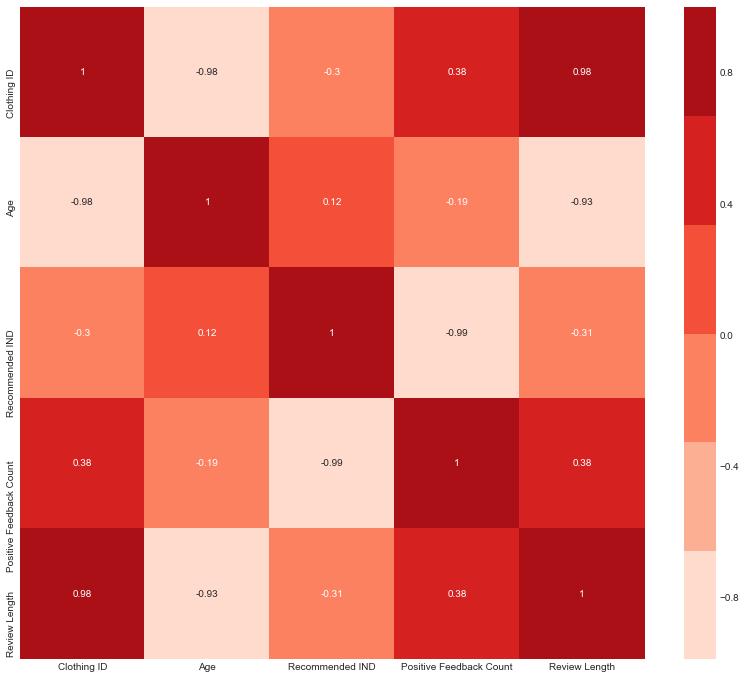

In [82]:

    
ax = sns.heatmap(rating.corr(), annot=True, cmap=sns.color_palette("Reds"))
plt.show()
my_dpi = 96*2

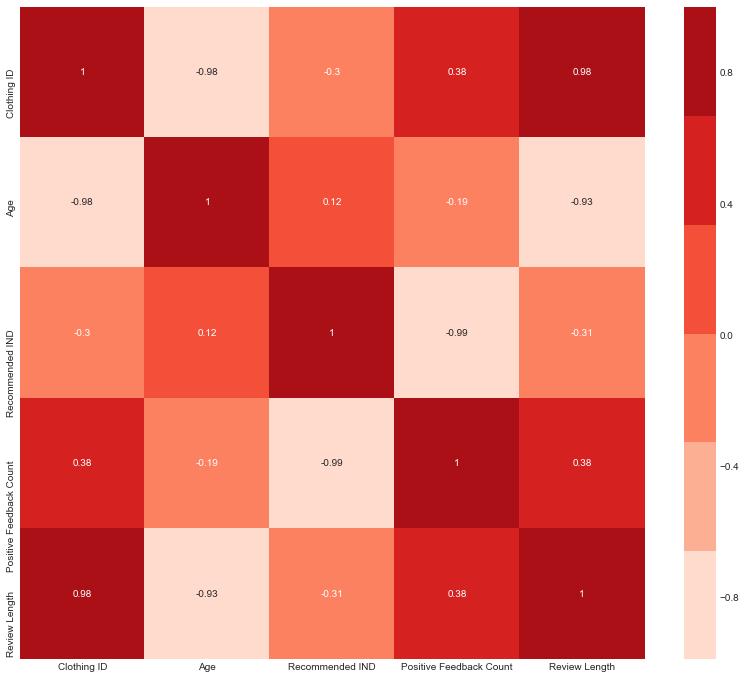

In [77]:
# part two 
#Create New data set with grouping based on rating
rating = yb.groupby('Rating').mean()
rating.corr()
ax = sns.heatmap(rating.corr(), annot=True, cmap=sns.color_palette("Reds"))
plt.show()
my_dpi = 96*2

In [40]:
result = yb.groupby(['Rating', pd.cut(yb['Age'], np.arange(0,100,10))])
result

In [41]:
result1 = result.size()
result1

Rating  Age     
1       (10, 20]       4
        (20, 30]     110
        (30, 40]     280
        (40, 50]     209
        (50, 60]     149
        (60, 70]      75
        (70, 80]      11
        (80, 90]       2
2       (10, 20]       4
        (20, 30]     210
        (30, 40]     564
        (40, 50]     420
        (50, 60]     233
        (60, 70]     106
        (70, 80]      22
        (80, 90]       5
3       (10, 20]      18
        (20, 30]     428
        (30, 40]    1014
        (40, 50]     749
        (50, 60]     411
        (60, 70]     216
        (70, 80]      30
        (80, 90]       4
4       (10, 20]      39
        (20, 30]     667
        (30, 40]    1752
        (40, 50]    1329
        (50, 60]     817
        (60, 70]     408
        (70, 80]      55
        (80, 90]       7
5       (10, 20]      87
        (20, 30]    1771
        (30, 40]    4302
        (40, 50]    3201
        (50, 60]    2281
        (60, 70]    1252
        (70, 80]     163
        

In [42]:
#unstack method turns index into column name
result2 = result1.unstack(0)
result2

Rating,1,2,3,4,5
Age,,,,,
"(10, 20]",4,4,18,39,87
"(20, 30]",110,210,428,667,1771
"(30, 40]",280,564,1014,1752,4302
"(40, 50]",209,420,749,1329,3201
"(50, 60]",149,233,411,817,2281
"(60, 70]",75,106,216,408,1252
"(70, 80]",11,22,30,55,163
"(80, 90]",2,5,4,7,68


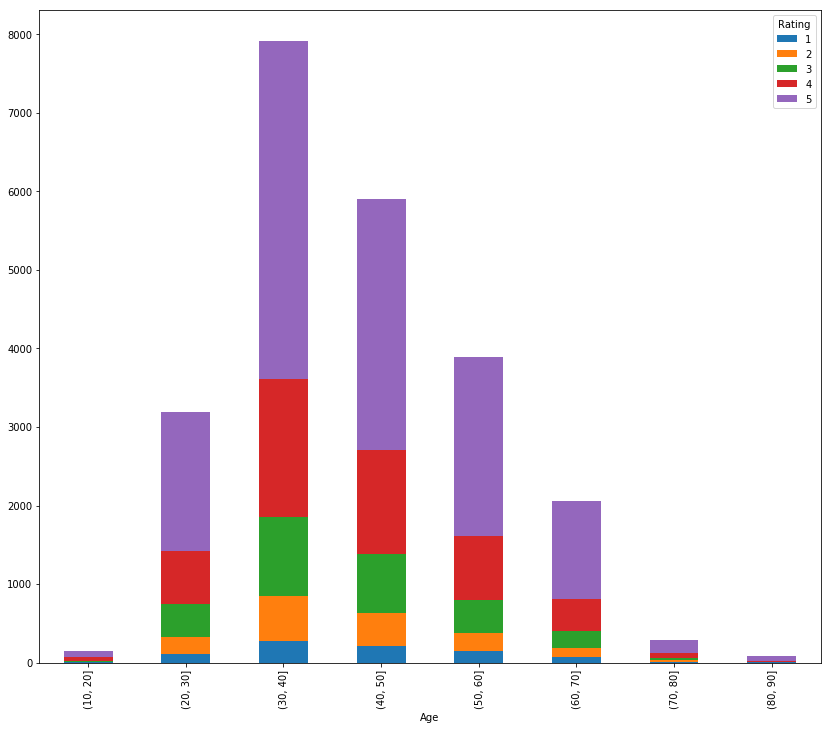

In [43]:
#plot graph stacked over each other
result2.plot.bar(stacked=True)

In [44]:
dep_grp= yb.groupby(['Department Name', pd.cut(yb['Age'], np.arange(0,100,10))])

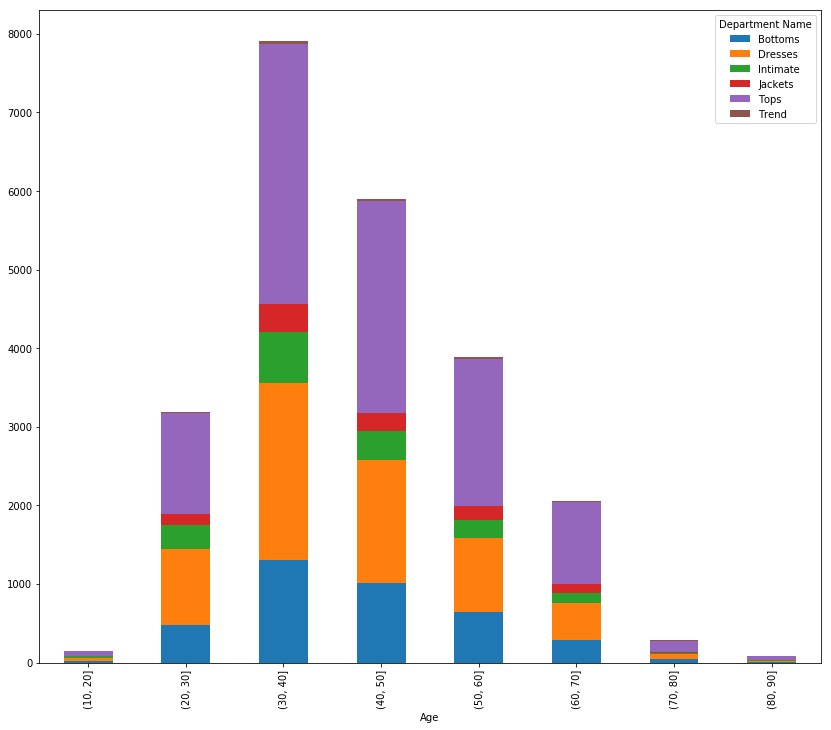

In [45]:
result1 = dep_grp.size()
result2 = result1.unstack(0)
result2.plot.bar(stacked=True)

In [46]:
y=yb.groupby(by=['Department Name'],as_index=False)
y

In [47]:
x = y.count()
x

,Department Name,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Class Name,Review Length
0,Bottoms,3799,3799,3799,3184,3799,3799,3799,3799,3799,3799,3799
1,Dresses,6319,6319,6319,5372,6319,6319,6319,6319,6319,6319,6319
2,Intimate,1735,1735,1735,1408,1735,1735,1735,1735,1735,1735,1735
3,Jackets,1032,1032,1032,879,1032,1032,1032,1032,1032,1032,1032
4,Tops,10468,10468,10468,8713,10468,10468,10468,10468,10468,10468,10468
5,Trend,119,119,119,107,119,119,119,119,119,119,119


In [48]:
z = x.sort_values(by='Class Name',ascending=False)
z

,Department Name,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Class Name,Review Length
4,Tops,10468,10468,10468,8713,10468,10468,10468,10468,10468,10468,10468
1,Dresses,6319,6319,6319,5372,6319,6319,6319,6319,6319,6319,6319
0,Bottoms,3799,3799,3799,3184,3799,3799,3799,3799,3799,3799,3799
2,Intimate,1735,1735,1735,1408,1735,1735,1735,1735,1735,1735,1735
3,Jackets,1032,1032,1032,879,1032,1032,1032,1032,1032,1032,1032
5,Trend,119,119,119,107,119,119,119,119,119,119,119


Text(0.5,1,'Counts Vs Department Name')

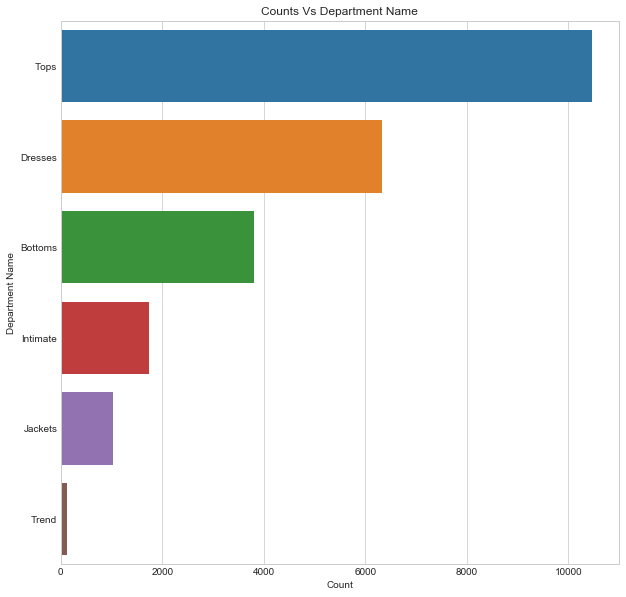

In [81]:
plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.barplot(x=z['Class Name'],y=z['Department Name'], data=z)
plt.ylabel("Department Name")
plt.xlabel("Count")
plt.title("Counts Vs Department Name")

In [50]:
## there are 6 department name , with Tops and Dresses being most popular

<Figure size 1080x1080 with 0 Axes>

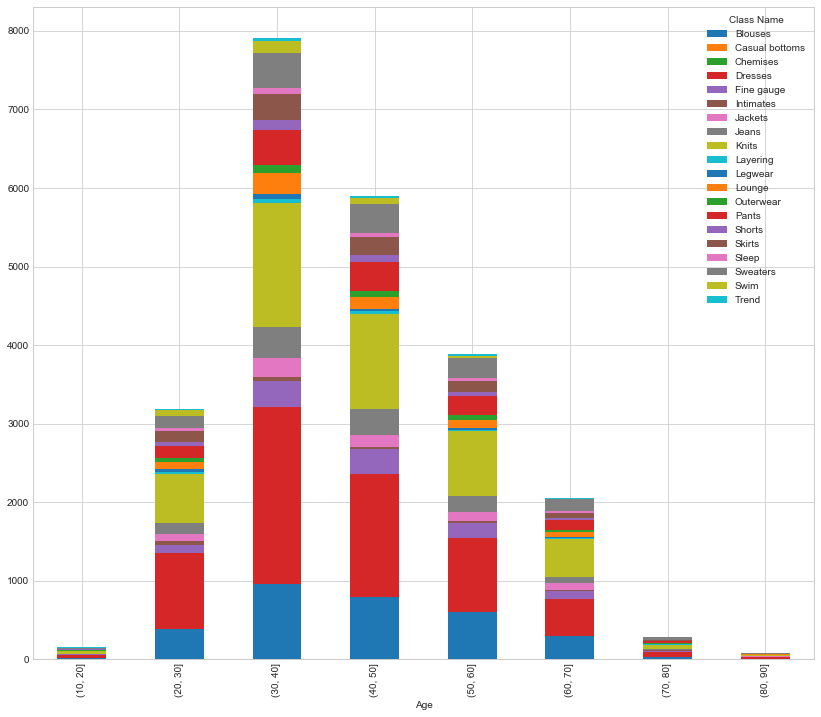

In [51]:
plt.figure(figsize=(15,15))
yb.groupby(['Class Name', pd.cut(yb['Age'], np.arange(0,100,10))])\
       .size()\
       .unstack(0)\
       .plot.bar(stacked=True)

Text(0.5,1,'Counts Vs Division Name')

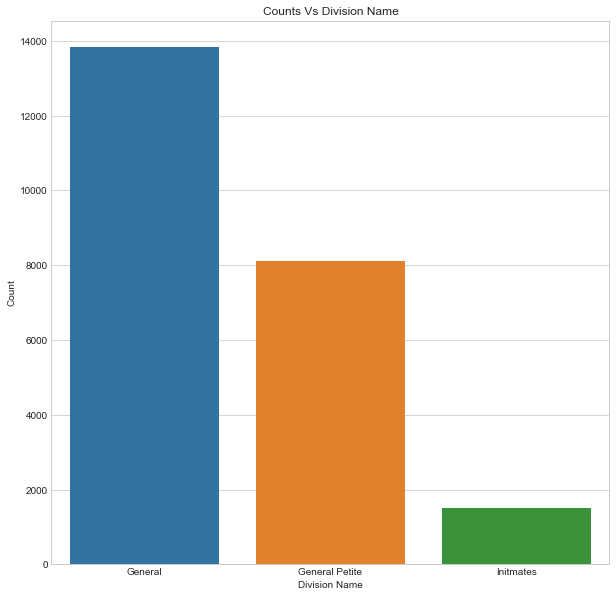

In [52]:
w=yb.groupby(by=['Division Name'],as_index=False).count().sort_values(by='Class Name',ascending=False)

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.barplot(x=w['Division Name'],y=w['Class Name'], data=w)
plt.xlabel("Division Name")
plt.ylabel("Count")
plt.title("Counts Vs Division Name")

There are 3 difeerent division , with highest sale in General

Creating a Word Count of Mesh

In [53]:
# Word Count Mesh
#make into one long string , all the reviews
a = yb['Review Text'].str.lower().str.cat(sep=' ')

In [54]:
# removes punctuation,numbers and returns list of words
b = re.sub('[^A-Za-z]+', ' ', a)

In [55]:
#remove all the stopwords from the text "is , an , preposition " in english language
stop_words = list(get_stop_words('en'))         
nltk_words = list(stopwords.words('english'))   
stop_words.extend(nltk_words)

In [56]:
#sentence or data can be split into words
word_tokens = word_tokenize(b)

In [57]:
#remove stop words from Data
filtered_sentence = []
for w in word_tokens:
    if w not in stop_words:
        filtered_sentence.append(w)

In [58]:
# Remove characters which have length less than 2  
without_single_chr = [word for word in filtered_sentence if len(word) > 2]

# Remove numbers
cleaned_data_title = [word for word in without_single_chr if not word.isnumeric()]  

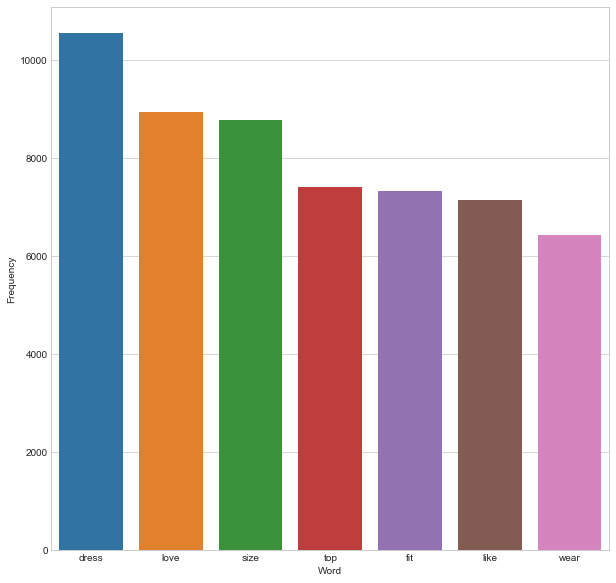

In [60]:
# Calculate frequency distribution
top_N = 100
word_dist = nltk.FreqDist(cleaned_data_title)
rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency'])

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.barplot(x="Word",y="Frequency", data=rslt.head(7))


In [ ]:
#this means dress word came highest number of time in the reviews

#Making the WORD CLOUD

In [61]:
def wc(data,bgcolor,title):
    plt.figure(figsize = (100,100))
    wordcloud = WordCloud(background_color = bgcolor, max_words = 1000,  max_font_size = 50)
    # Generate a word cloud image
    wordcloud.generate(' '.join(data)) 
    # Display the generated image:
    # the matplotlib way:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')

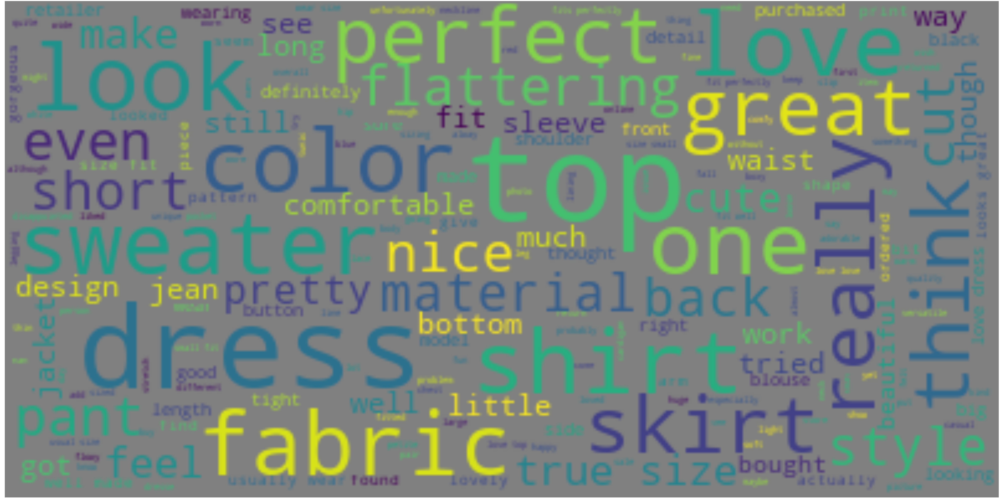

In [62]:
#Generating a square wordcloud from the word 
wc(cleaned_data_title,'grey','Most Used Words')

Word Cloud shows Most common words

Perform Sentiment Analysis , i.e categorise reviews as negative/neutral/positive

Two Ways To Peform Sentimental Analysis :
1. Lexicon-based methods
2. Machine Learning-based methods.

We will use Lexicon-based method using textblob , their are other libraries as well like NLTK , Spacy which performs complex analysis.

Sentiment function of textblob returns a named tuple with two properties, polarity, and subjectivity

Polarity is float which lies in the range of [-1,1] where 1 means positive statement and -1 means a negative statement.

Subjective sentences generally refer to personal opinion, emotion or judgment whereas objective refers to factual information. Subjectivity is also a float which lies in the range of [0,1]. 0.0 is very objective and 1.0 is very subjective.




In [63]:
#create an empty list to store output of sentiment function of textblob
bloblist_desc = list()

df_review_str=yb['Review Text'].astype(str)

for row in df_review_str:
    blob = TextBlob(row)
    bloblist_desc.append((row, blob.sentiment.polarity, blob.sentiment.subjectivity))
    df_polarity_desc = pd.DataFrame(bloblist_desc, columns = ['Review','sentiment','polarity'])
 
df_polarity_desc.head(7)

,Review,sentiment,polarity
0,Absolutely wonderful - silky and sexy and comf...,0.633333,0.933333
1,Love this dress! it's sooo pretty. i happene...,0.339583,0.725000
2,I had such high hopes for this dress and reall...,0.073675,0.356294
3,"I love, love, love this jumpsuit. it's fun, fl...",0.550000,0.625000
4,This shirt is very flattering to all due to th...,0.512891,0.568750
5,"I love tracy reese dresses, but this one is no...",0.178750,0.533125
6,I aded this in my basket at hte last mintue to...,0.133750,0.607778


In [66]:
#Defining a function which categorise comments based on polarity
def f(df_polarity_desc):
    if df_polarity_desc['sentiment'] > 0:
        val = "Positive Review"
    elif df_polarity_desc['sentiment'] == 0:
        val = "Neutral Review"
    else:
        val = "Negative Review"
    return val


In [67]:
#applying function to dataframe
df_polarity_desc['Sentiment_Type'] = df_polarity_desc.apply(f, axis=1)

In [68]:
df_polarity_desc.head(5)

,Review,sentiment,polarity,Sentiment_Type
0,Absolutely wonderful - silky and sexy and comf...,0.633333,0.933333,Positive Review
1,Love this dress! it's sooo pretty. i happene...,0.339583,0.725000,Positive Review
2,I had such high hopes for this dress and reall...,0.073675,0.356294,Positive Review
3,"I love, love, love this jumpsuit. it's fun, fl...",0.550000,0.625000,Positive Review
4,This shirt is very flattering to all due to th...,0.512891,0.568750,Positive Review


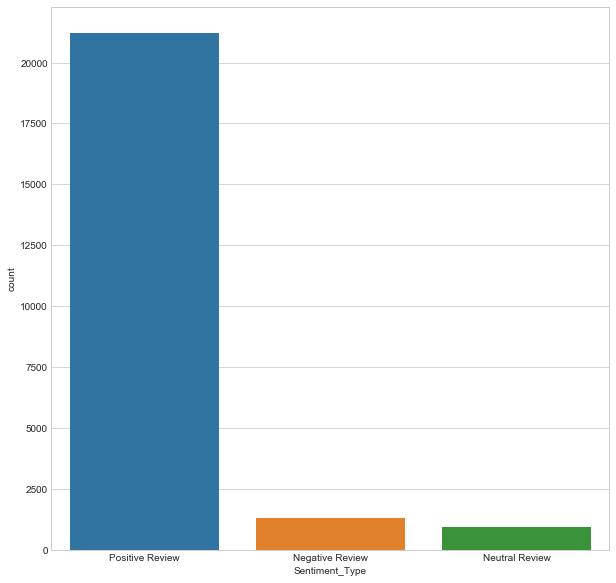

In [69]:
#Plotting count of Sentiment , +ve , neutral and -ve

plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Type", data=df_polarity_desc)

In [78]:
positive_reviews=df_polarity_desc[df_polarity_desc['Sentiment_Type']=='Positive Review']
negative_reviews=df_polarity_desc[df_polarity_desc['Sentiment_Type']=='Negative Review']

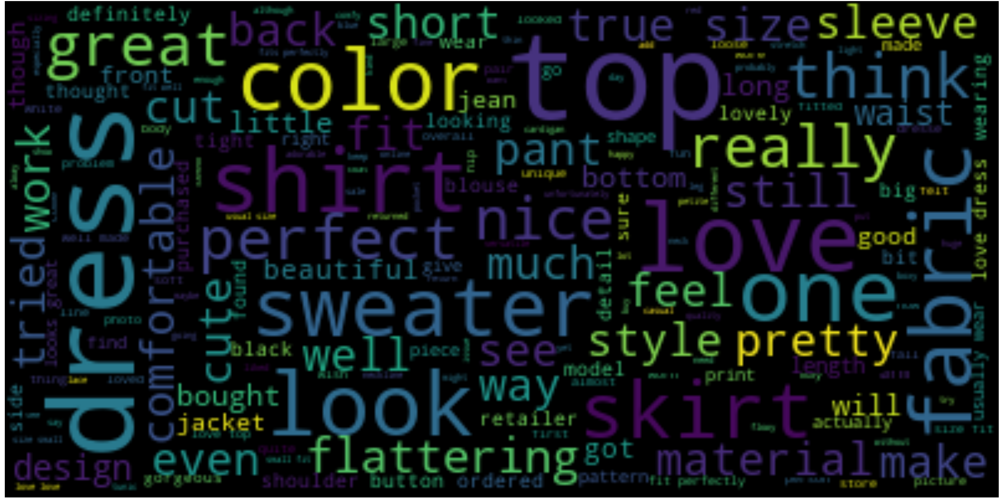

In [79]:
#word cloud of +ve
wc(positive_reviews['Review'],'black','Most Used Words')

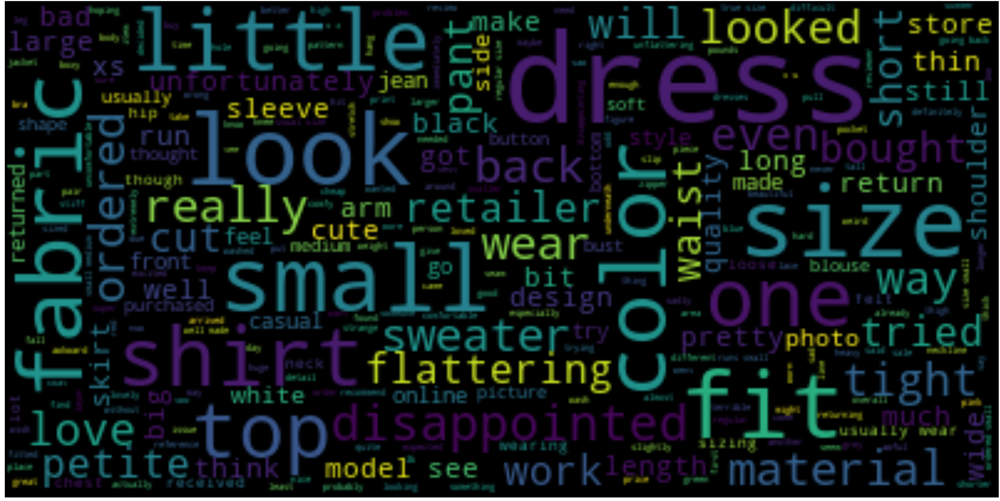

In [80]:
#world cloud of -ve
wc(negative_reviews['Review'],'black','Most Used Words')

# Predticing Rating

In [ ]:
yb=yb.dropna(axis=0,how='any')
rating_class = yb[(yb['Rating'] == 1) | (yb['Rating'] == 5)]
X_review=rating_class['Review Text']
y=rating_class['Rating']

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
bow_transformer=CountVectorizer(analyzer=text_process).fit(X_review)

In [ ]:
print(len(bow_transformer.vocabulary_))

In [ ]:
X_review = bow_transformer.transform(X_review)

In [ ]:
#test , train , validate

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_review, y, test_size=0.3, random_state=101)

To predict the rating of the reviews, we will use Naive Bayes Machine Learning Algorithm. Since this works well with the text data.

In [ ]:
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()
nb.fit(X_train, y_train)

In [ ]:
#Testing the model
predict=nb.predict(X_test)

Once we predicted the values, now the most important task is to check and evaluate our model against the actual ratings (stored in y_test) using confusion_matrix and classification_report from Scikit-learn.

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test, predict))
print('\n')
print(classification_report(y_test, predict))

95% accuracy

Testing model with value

In [ ]:
rating_positive=yb['Review Text'][3]
rating_positive

In [ ]:
rating_positive_transformed = bow_transformer.transform([rating_positive])
nb.predict(rating_positive_transformed)[0]

In [ ]:
rating_negative=yb['Review Text'][61]
rating_negative

In [ ]:
rating_negative_transformed = bow_transformer.transform([rating_negative])
nb.predict(rating_negative_transformed)[0]

# Predict Recommendation

In [ ]:
X_predict_recommend=yb['Review Text']
y_recommend=yb['Recommended IND']

bow_transformer=CountVectorizer(analyzer=text_process).fit(X_predict_recommend)

X_predict_recommend = bow_transformer.transform(X_predict_recommend)

X_train, X_test, y_train, y_test = train_test_split(X_predict_recommend, y_recommend, test_size=0.3, random_state=101)

nb = MultinomialNB()
nb.fit(X_train, y_train)

predict_recommendation=nb.predict(X_test)


print(confusion_matrix(y_test, predict_recommendation))
print('\n')
print(classification_report(y_test, predict_recommendation))

In [ ]:
rating_positive_transformed = bow_transformer.transform([rating_positive])
nb.predict(rating_positive_transformed)[0]

In [ ]:
rating_negative_transformed = bow_transformer.transform([rating_negative])
nb.predict(rating_negative_transformed)[0]